In [ ]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
!pip install shap


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 5.4 MB/s eta 0:00:00


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=252ecfafed374b9593ffde5eb4e5230741100483adb5fb637e861c04b40e3325
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import numpy as np # linear algebra
import pandas as pd
import pandas as pd


import sklearn.utils as u
import sklearn.preprocessing as pp
import sklearn.tree as tr
import sklearn.ensemble as es
import sklearn.metrics as m
import sklearn.linear_model as lm
import sklearn.neural_network as nn

 # data processing, CSV file I/O (e.g. pd.read_csv)


In [ ]:
data_df = pd.read_csv('/content/INCART 2-lead Arrhythmia Database.csv')
print(data_df.shape)
data_df.head()

(175729, 34)


,record,type,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,...,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval,1_qrs_morph0,1_qrs_morph1,1_qrs_morph2,1_qrs_morph3,1_qrs_morph4
0,I01,N,163,165,0.069610,-0.083281,0.614133,-0.392761,0.047159,15,...,-0.023370,14,3,23,6,-0.023370,-0.011650,0.082608,0.101373,-0.183387
1,I01,N,165,166,-0.097030,0.597254,-0.078704,-0.078704,-0.137781,3,...,0.081637,15,5,27,7,0.081637,0.102992,0.191225,0.217544,-0.068248
2,I01,N,166,102,0.109399,0.680528,-0.010649,-0.010649,-0.720620,6,...,-0.148539,33,13,52,6,-0.148539,-0.060620,0.081080,0.204400,0.335172
3,I01,VEB,102,231,0.176376,0.256431,-0.101098,-0.707525,-0.101098,4,...,0.046898,21,9,34,4,0.046898,0.083728,0.279512,0.526785,0.450969
4,I01,N,231,165,0.585577,0.607461,-0.083499,-0.083499,-0.167858,3,...,-0.112552,32,5,43,6,-0.112552,0.012989,0.091491,0.134004,0.265232


In [ ]:
x_data = data_df.iloc[:, 2:]
y_label = data_df.iloc[:, 1]

In [ ]:
y_label.head()

0      N
1      N
2      N
3    VEB
4      N
Name: type, dtype: object

In [ ]:
x_data.shape

(175729, 32)

In [ ]:
x_data.columns

Index(['0_pre-RR', '0_post-RR', '0_pPeak', '0_tPeak', '0_rPeak', '0_sPeak',
       '0_qPeak', '0_qrs_interval', '0_pq_interval', '0_qt_interval',
       '0_st_interval', '0_qrs_morph0', '0_qrs_morph1', '0_qrs_morph2',
       '0_qrs_morph3', '0_qrs_morph4', '1_pre-RR', '1_post-RR', '1_pPeak',
       '1_tPeak', '1_rPeak', '1_sPeak', '1_qPeak', '1_qrs_interval',
       '1_pq_interval', '1_qt_interval', '1_st_interval', '1_qrs_morph0',
       '1_qrs_morph1', '1_qrs_morph2', '1_qrs_morph3', '1_qrs_morph4'],
      dtype='object')

In [ ]:
x_data.head()

,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,0_pq_interval,0_qt_interval,...,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval,1_qrs_morph0,1_qrs_morph1,1_qrs_morph2,1_qrs_morph3,1_qrs_morph4
0,163,165,0.069610,-0.083281,0.614133,-0.392761,0.047159,15,2,27,...,-0.023370,14,3,23,6,-0.023370,-0.011650,0.082608,0.101373,-0.183387
1,165,166,-0.097030,0.597254,-0.078704,-0.078704,-0.137781,3,5,14,...,0.081637,15,5,27,7,0.081637,0.102992,0.191225,0.217544,-0.068248
2,166,102,0.109399,0.680528,-0.010649,-0.010649,-0.720620,6,25,35,...,-0.148539,33,13,52,6,-0.148539,-0.060620,0.081080,0.204400,0.335172
3,102,231,0.176376,0.256431,-0.101098,-0.707525,-0.101098,4,3,14,...,0.046898,21,9,34,4,0.046898,0.083728,0.279512,0.526785,0.450969
4,231,165,0.585577,0.607461,-0.083499,-0.083499,-0.167858,3,34,43,...,-0.112552,32,5,43,6,-0.112552,0.012989,0.091491,0.134004,0.265232


In [ ]:
y_label.value_counts()

N       153546
VEB      20000
SVEB      1958
F          219
Q            6
Name: type, dtype: int64

In [ ]:
# Transform multi-class labels into binary-class (arrhythmia and normal)
y_label.replace(['VEB', 'SVEB', 'F', 'Q'], 'arrhythmia', inplace=True)
y_label.replace(['N'], 'normal', inplace=True)

In [ ]:
y_label.value_counts()

normal        153546
arrhythmia     22183
Name: type, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x_data, y_label, random_state=101)

In [ ]:
X_test.head()

,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,0_pq_interval,0_qt_interval,...,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval,1_qrs_morph0,1_qrs_morph1,1_qrs_morph2,1_qrs_morph3,1_qrs_morph4
120843,277,119,-0.051119,1.865160,1.849289,1.849289,-0.055553,10,2,13,...,0.018885,15,5,29,9,0.018885,0.043751,0.085421,-0.070283,-0.497336
12242,195,195,-0.046602,-0.107198,0.775312,-0.794079,-0.057439,15,2,24,...,-0.031305,6,3,20,11,-0.031305,-0.156955,-0.329534,-0.523498,-0.699491
18033,230,225,0.245465,-0.091412,0.795675,-0.586555,-0.071757,22,21,49,...,-0.117824,5,3,15,7,-0.117824,-0.252360,-0.406910,-0.552033,-0.651967
13563,174,173,0.070912,-0.153441,0.829452,-0.776009,-0.120852,21,14,42,...,-0.090446,5,3,20,12,-0.090446,-0.234289,-0.411310,-0.588435,-0.727824
123464,374,124,-0.081175,-0.508245,1.871515,-0.702749,-0.098000,20,3,28,...,-0.172662,6,4,19,9,-0.172662,-0.308510,-0.465843,-0.633222,-0.789670


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder instance
label_encoder = LabelEncoder()

# Fit and transform the target variable
y_train_encoded = label_encoder.fit_transform(y_train.values.ravel())



In [ ]:
y_train_encoded

array([1, 1, 1, ..., 1, 1, 1])

In [ ]:
X_train_filled = X_train.fillna(0)

In [ ]:
X_train_filled.isna().sum()

0_pre-RR          0
0_post-RR         0
0_pPeak           0
0_tPeak           0
0_rPeak           0
0_sPeak           0
0_qPeak           0
0_qrs_interval    0
0_pq_interval     0
0_qt_interval     0
0_st_interval     0
0_qrs_morph0      0
0_qrs_morph1      0
0_qrs_morph2      0
0_qrs_morph3      0
0_qrs_morph4      0
1_pre-RR          0
1_post-RR         0
1_pPeak           0
1_tPeak           0
1_rPeak           0
1_sPeak           0
1_qPeak           0
1_qrs_interval    0
1_pq_interval     0
1_qt_interval     0
1_st_interval     0
1_qrs_morph0      0
1_qrs_morph1      0
1_qrs_morph2      0
1_qrs_morph3      0
1_qrs_morph4      0
dtype: int64

In [ ]:
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler()
X_train_scaled = min_max_scaler.fit_transform(X_train_filled)
X_test_scaled = min_max_scaler.transform(X_test)

print(min_max_scaler.scale_)

[0.00218818 0.00229885 0.06768416 0.07941153 0.08591588 0.08457736
 0.09763499 0.01       0.01030928 0.00543478 0.01136364 0.09763499
 0.09453222 0.08621611 0.08564016 0.08314263 0.00218818 0.00229885
 0.11448472 0.17645207 0.1548341  0.1641427  0.12751906 0.0078125
 0.00833333 0.0034965  0.01176471 0.12751906 0.12991263 0.12456321
 0.17443524 0.16957699]


In [ ]:
X_train_scaled

array([[0.36980306, 0.33793103, 0.28814505, ..., 0.40928488, 0.353508  ,
        0.33951663],
       [0.37417943, 0.30804598, 0.28225252, ..., 0.42779418, 0.4200029 ,
        0.41052715],
       [0.33916849, 0.30804598, 0.28252265, ..., 0.51566218, 0.54097644,
        0.50634876],
       ...,
       [0.37199125, 0.31954023, 0.28265874, ..., 0.50749206, 0.51842937,
        0.51287855],
       [0.31291028, 0.26896552, 0.28047361, ..., 0.46131061, 0.43670414,
        0.4269881 ],
       [0.3238512 , 0.29195402, 0.28182929, ..., 0.49715765, 0.51874512,
        0.55388875]])

In [ ]:
X_train_1 = np.array(X_train_scaled)

In [ ]:
X_train_1.shape

(131796, 32)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
model = RandomForestClassifier(random_state=101, n_estimators=150)

In [ ]:
model.fit(X_train_scaled, y_train.values.ravel())

RandomForestClassifier(n_estimators=150, random_state=101)

In [ ]:
modelD = tr.DecisionTreeClassifier(random_state=101)

In [ ]:
modelD.fit(X_train_scaled, y_train_encoded.ravel())

DecisionTreeClassifier(random_state=101)

In [ ]:
# !pip install xgboost
import xgboost
from xgboost import XGBClassifier

# Create an XGBoost classifier
xgb_model = XGBClassifier(random_state=101, n_estimators=150)

# Fit the model to the training data
xgb_model.fit(X_train_scaled, y_train_encoded.ravel())

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=150, n_jobs=None,
              num_parallel_tree=None, random_state=101, ...)

In [ ]:
from sklearn.svm import SVC

# Create an SVM classifier
svm_model = SVC(random_state=101)

# Fit the model to the training data
svm_model.fit(X_train_scaled, y_train_encoded.ravel())


SVC(random_state=101)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

# Create a Gradient Boosting classifier
gb_model = GradientBoostingClassifier(random_state=101, n_estimators=150)

# Fit the model to the training data
gb_model.fit(X_train_scaled, y_train.values.ravel())

# Now you can use the trained model for predictions
# For example, y_pred_gb = gb_model.predict(X_test_scaled)


GradientBoostingClassifier(n_estimators=150, random_state=101)

Random Forest Accuracy: 0.9968
XGBoost Accuracy: 0.9972
SVM Accuracy: 0.9916
Gradient Boosting Accuracy: 0.9942
DecisionTree Accuracy: 0.9932


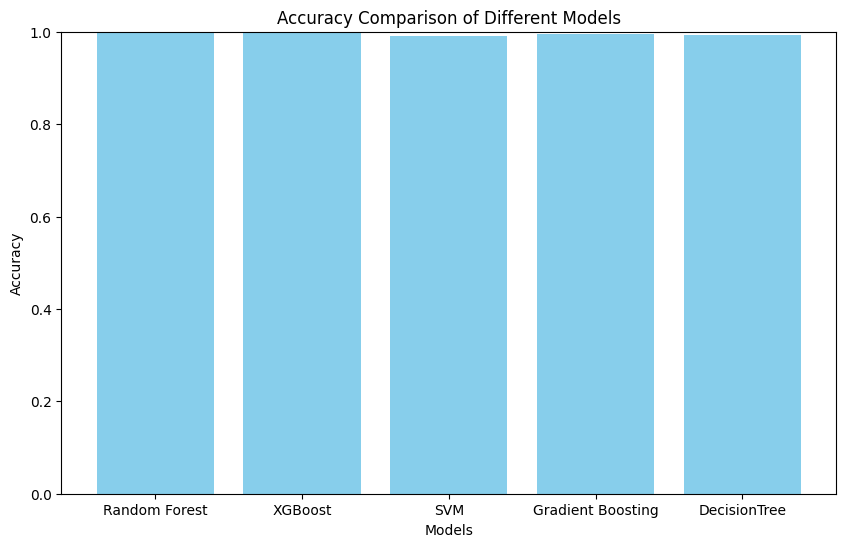

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
import numpy as np

# Assuming you have a list of models and their names
models = [model, xgb_model, svm_model, gb_model,modelD]  # Add your models here
model_names = ['Random Forest', 'XGBoost', 'SVM', 'Gradient Boosting',"DecisionTree"]  # Corresponding model names

# Lists to store accuracy scores
accuracies = []

# Iterate through models
for model, name in zip(models, model_names):
    # Assuming you have training data X_train and labels y_train
    # Use cross-validation to get a more robust accuracy measure
    accuracy_scores = cross_val_score(model, X_train_scaled, y_train_encoded, cv=5, scoring='accuracy')
    mean_accuracy = np.mean(accuracy_scores)

    # Print accuracy for each model
    print(f'{name} Accuracy: {mean_accuracy:.4f}')

    # Store accuracy for plotting
    accuracies.append(mean_accuracy)

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color='skyblue')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison of Different Models')
plt.ylim(0.0, 1.0)  # Assuming accuracy is between 0 and 1
plt.show()


Random Forest Precision: 0.9976, Recall: 0.9987
XGBoost Precision: 0.9980, Recall: 0.9988
SVM Precision: 0.9933, Recall: 0.9971
Gradient Boosting Precision: 0.9950, Recall: 0.9984
DecisionTree Precision: 0.9960, Recall: 0.9962


ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (5,) and arg 1 with shape (0,).

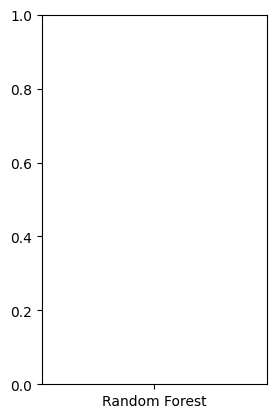

In [ ]:
precisions = []
recalls = []
for model, name in zip(models, model_names):
  precision_scores = cross_val_score(model, X_train_scaled, y_train_encoded, cv=5, scoring='precision')
  recall_scores = cross_val_score(model, X_train_scaled, y_train_encoded, cv=5, scoring='recall')
  mean_precision = np.mean(precision_scores)
  mean_recall = np.mean(recall_scores)
  print(f'{name} Precision: {mean_precision:.4f}, Recall: {mean_recall:.4f}')
plt.subplot(1, 2, 1)
plt.bar(model_names, precisions, color='lightcoral')
plt.xlabel('Models')
plt.ylabel('Precision')
plt.title('Precision Comparison of Different Models')
plt.ylim(0.0, 1.0)  # Assuming precision is between 0 and 1

# Recall plot
plt.subplot(1, 2, 2)
plt.bar(model_names, recalls, color='lightgreen')
plt.xlabel('Models')
plt.ylabel('Recall')
plt.title('Recall Comparison of Different Models')
plt.ylim(0.0, 1.0)  # Assuming recall is between 0 and 1

plt.tight_layout()
plt.show()



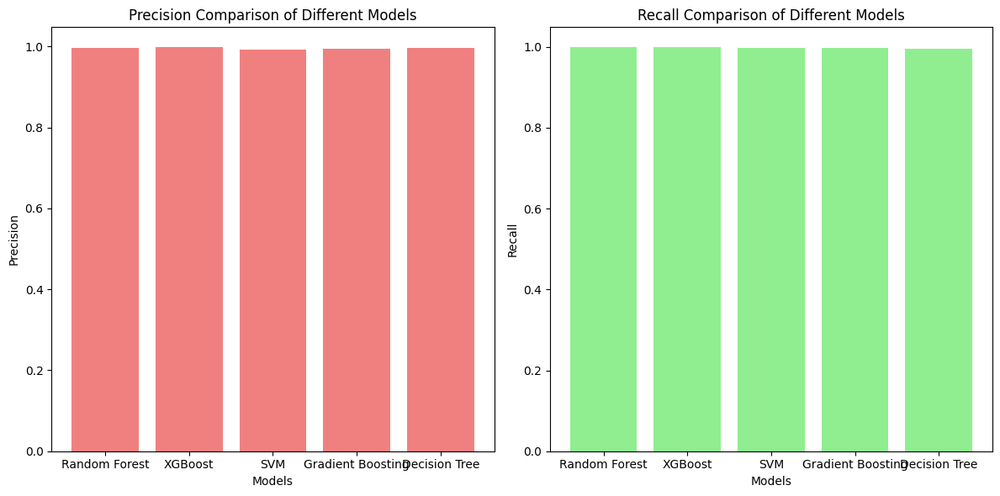

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Precision and recall values
precisions = [0.9976, 0.9980, 0.9933, 0.9950, 0.9960]
recalls = [0.9987, 0.9988, 0.9971, 0.9984, 0.9962]

# Model names
model_names = ['Random Forest', 'XGBoost', 'SVM', 'Gradient Boosting', 'Decision Tree']

# Plotting
plt.figure(figsize=(12, 6))

# Precision plot
plt.subplot(1, 2, 1)
plt.bar(model_names, precisions, color='lightcoral')
plt.xlabel('Models')
plt.ylabel('Precision')
plt.title('Precision Comparison of Different Models')

# Recall plot
plt.subplot(1, 2, 2)
plt.bar(model_names, recalls, color='lightgreen')
plt.xlabel('Models')
plt.ylabel('Recall')
plt.title('Recall Comparison of Different Models')

plt.tight_layout()
plt.show()

In [ ]:
import lime
import lime.lime_tabular

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_scaled,feature_names = x_data.columns , verbose = True, mode = 'classification' )

In [ ]:
X_test.iloc[0]

0_pre-RR          277.000000
0_post-RR         119.000000
0_pPeak            -0.051119
0_tPeak             1.865160
0_rPeak             1.849289
0_sPeak             1.849289
0_qPeak            -0.055553
0_qrs_interval     10.000000
0_pq_interval       2.000000
0_qt_interval      13.000000
0_st_interval       1.000000
0_qrs_morph0       -0.055553
0_qrs_morph1       -0.024465
0_qrs_morph2        0.175419
0_qrs_morph3        0.659308
0_qrs_morph4        1.350569
1_pre-RR          277.000000
1_post-RR         119.000000
1_pPeak             0.024533
1_tPeak             0.402510
1_rPeak             0.085421
1_sPeak            -0.861475
1_qPeak             0.018885
1_qrs_interval     15.000000
1_pq_interval       5.000000
1_qt_interval      29.000000
1_st_interval       9.000000
1_qrs_morph0        0.018885
1_qrs_morph1        0.043751
1_qrs_morph2        0.085421
1_qrs_morph3       -0.070283
1_qrs_morph4       -0.497336
Name: 120843, dtype: float64

In [ ]:
X_test_scaled

array([[0.49890591, 0.11034483, 0.28139569, ..., 0.50739322, 0.50431114,
        0.4468014 ],
       [0.31947484, 0.28505747, 0.28170138, ..., 0.45570517, 0.42525456,
        0.41252062],
       [0.39606127, 0.35402299, 0.30146969, ..., 0.44606691, 0.42027708,
        0.4205796 ],
       ...,
       [0.51641138, 0.45747126, 0.29334992, ..., 0.46412727, 0.45381459,
        0.45911551],
       [0.28227571, 0.24367816, 0.28291683, ..., 0.43112355, 0.3893399 ,
        0.38468587],
       [0.16411379, 0.11954023, 0.29949358, ..., 0.44163192, 0.39698308,
        0.3799076 ]])

In [ ]:
row_index = 0  # Replace this with the index of the instance you want to explain
exp = explainer.explain_instance(X_test_scaled[row_index], model.predict_proba, num_features=5)
print(y_test.iloc[row_index])
exp.show_in_notebook(show_table = True)

Intercept 0.5658551089076244
Prediction_local [0.87634152]
Right: 0.9666666666666667
normal


In [ ]:
row_index = 22
# Replace this with the index of the instance you want to explain
exp = explainer.explain_instance(X_test_scaled[row_index], model.predict_proba, num_features=5)
exp.show_in_notebook(show_table = True)


Intercept 0.7733572376409487
Prediction_local [0.27139422]
Right: 0.0


In [ ]:
row_index = 22
# Replace this with the index of the instance you want to explain
exp = explainer.explain_instance(X_test_scaled[row_index], model.predict_proba, num_features=5)
print(y_test.iloc[row_index])
exp.show_in_notebook(show_table = True)


Intercept 0.773144470621848
Prediction_local [0.26504806]
Right: 0.0
arrhythmia


In [ ]:
y_sqwe = y_test.values
# print(y_sqwe)
count = 0
for i in range(len(y_sqwe)):
  if(y_sqwe[i]=="arrhythmia"):
    count += 1
    print(i)
  if count == 5:
    break



22
30
36
45
46


In [ ]:
# Gradient boost Classifier using Lime
row_index = 10
gb_exp = explainer.explain_instance(X_test_scaled[row_index], gb_model.predict_proba, num_features=5)
print(y_test.iloc[row_index])
gb_exp.show_in_notebook(show_table = True)



Intercept 0.8251494642667541
Prediction_local [0.68661578]
Right: 0.9986882041239613
normal


In [ ]:
# Create a LimeTabularExplainer for XGBoost
# Replace this with the index of the instance you want to explain
row_index = 22
xgb_exp = explainer.explain_instance(X_test_scaled[row_index], xgb_model.predict_proba, num_features=5)
print(y_test.iloc[row_index])
xgb_exp.show_in_notebook(show_table = True)



Intercept 0.9556458092551982
Prediction_local [0.15044959]
Right: 1.817585e-05
arrhythmia


In [ ]:
# Create a LimeTabularExplainer for Decision Tree
# dt_explainer = LimeTabularExplainer(X_train_scaled, feature_names=x_data.columns, mode='classification')

# Replace this with the index of the instance you want to explain
row_index = 22
dt_exp = explainer.explain_instance(X_test_scaled[row_index], modelD.predict_proba, num_features=5)
print(y_test.iloc[row_index])
dt_exp.show_in_notebook(show_table = True)


Intercept 0.8071299439473447
Prediction_local [0.12107472]
Right: 0.0
arrhythmia


In [ ]:
from sklearn.calibration import CalibratedClassifierCV

# Create a calibrated SVM classifier
calibrated_svm = CalibratedClassifierCV(svm_model, method='sigmoid', cv='prefit')
calibrated_svm.fit(X_train_scaled, y_train.values.ravel())

# Create a LimeTabularExplainer for calibrated SVM
calibrated_svm_explainer = lime.lime_tabular.LimeTabularExplainer(X_train_scaled, feature_names=x_data.columns, mode='classification')

# Define a function to get calibrated probabilities
def calibrated_svm_predict_proba(X):
    return calibrated_svm.predict_proba(X)

# Replace this with the index of the instance you want to explain
calibrated_svm_exp = calibrated_svm_explainer.explain_instance(X_test_scaled[row_index], calibrated_svm_predict_proba, num_features=5)
print(y_test.iloc[row_index])
calibrated_svm_exp.show_in_notebook(show_table = True)


normal


In [ ]:
print('Accuracy for the train data', model.score(X_train_scaled, y_train))

Accuracy for the train data 1.0


In [ ]:
from sklearn import metrics
y_pred = model.predict(X_test_scaled)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

print("*** Confusion Matrix ***")
print(metrics.confusion_matrix(y_test, y_pred))

Accuracy: 0.9972230441809118
*** Confusion Matrix ***
[[ 5434    77]
 [   45 38377]]


In [ ]:
import shap

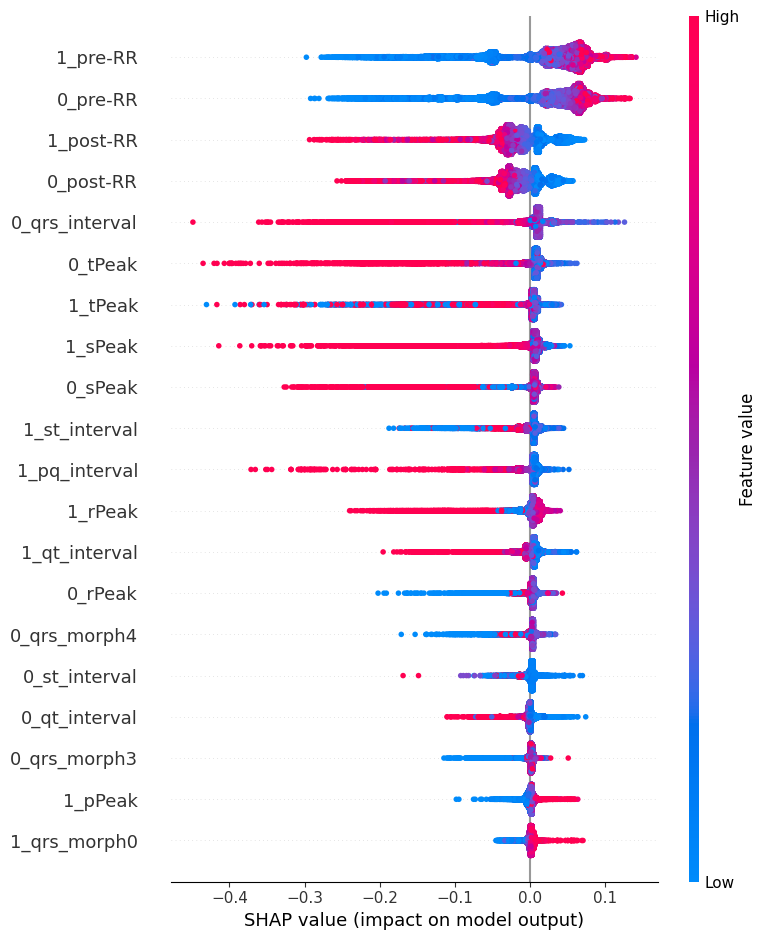

In [ ]:
import shap

# Assuming you have already trained the RandomForest model
rf_explainer = shap.TreeExplainer(model)
rf_shap_values = rf_explainer.shap_values(X_test_scaled)





# Visualize SHAP summary plots for each model
shap.summary_plot(rf_shap_values[1], X_test_scaled, feature_names=X_test.columns,class_names=['arrhythmia', 'normal'])

# # shap.summary_plot(calibrated_svm_shap_values, X_test_scaled, plot_type="bar", class_names=['arrhythmia', 'normal'])


In [ ]:
row_to_show = 22
data_for_prediction = X_test_scaled[row_to_show]

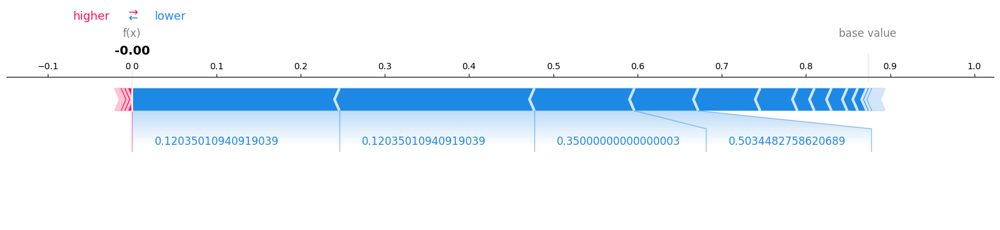

In [ ]:
shap.force_plot(rf_explainer.expected_value[1], rf_shap_values[1][row_to_show], data_for_prediction, matplotlib=True)

In [ ]:
# Assuming you have already trained the Gradient Boosting model
gb_explainer = shap.TreeExplainer(gb_model)
gb_shap_values = gb_explainer.shap_values(X_test_scaled)


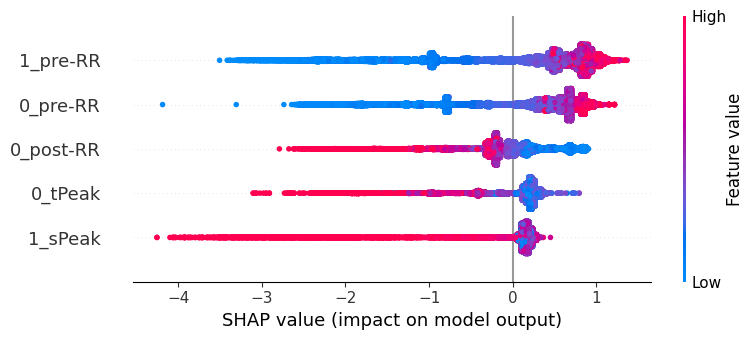

In [ ]:
shap.summary_plot(gb_shap_values, X_test_scaled,feature_names=X_test.columns,max_display =5,class_names=['arrhythmia', 'normal'])
# shap.summary_plot(rf_shap_values[1], X_test_scaled,feature_names=X_test.columns,class_names=['arrhythmia', 'normal'])

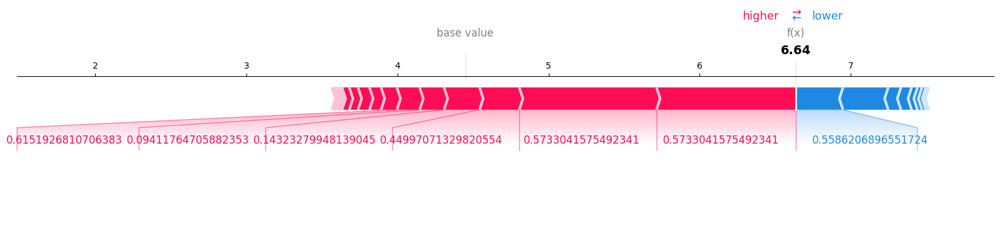

In [ ]:
row_to_show = 10
data_for_prediction = X_test_scaled[row_to_show]
shap.force_plot(gb_explainer.expected_value, gb_shap_values[row_to_show], data_for_prediction, matplotlib=True)

In [ ]:
# Assuming you have already trained the XGBoost model
xgb_explainer = shap.TreeExplainer(xgb_model)
xgb_shap_values = xgb_explainer.shap_values(X_test_scaled)

[15:33:30] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


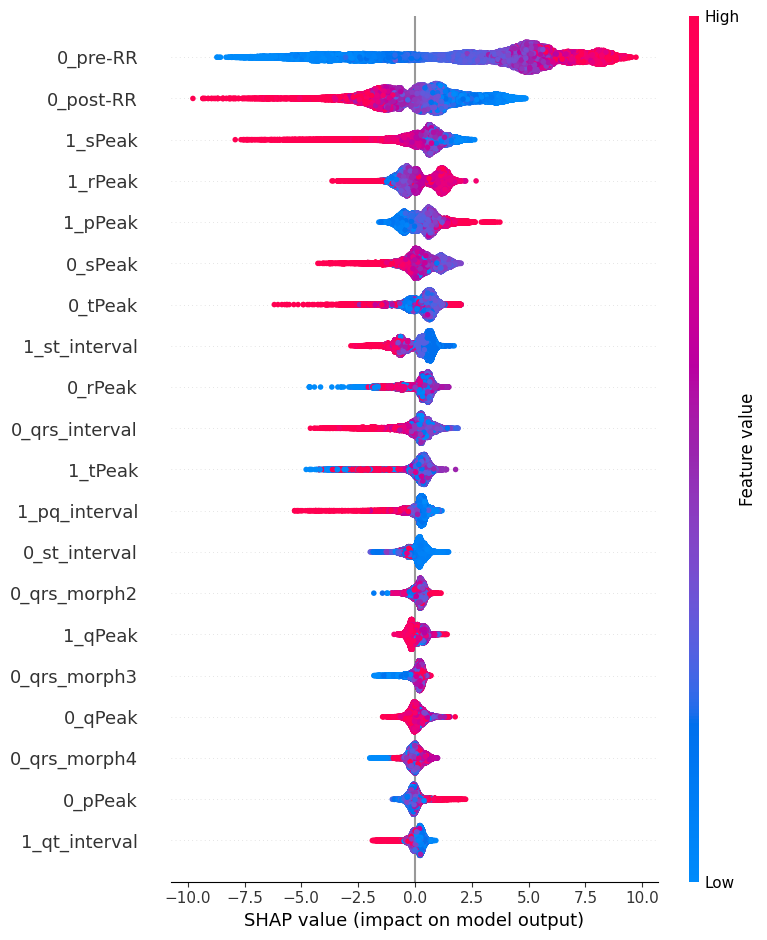

In [ ]:
shap.summary_plot(xgb_shap_values, X_test_scaled,feature_names=X_test.columns,class_names=['arrhythmia', 'normal'])

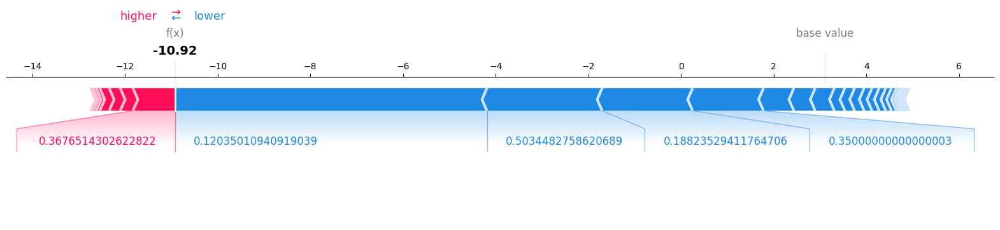

In [ ]:
shap.force_plot(xgb_explainer.expected_value, xgb_shap_values[22], data_for_prediction, matplotlib=True)

In [ ]:
# Assuming you have already trained the Decision Tree model
dt_explainer = shap.TreeExplainer(modelD)
dt_shap_values = dt_explainer.shap_values(X_test_scaled)

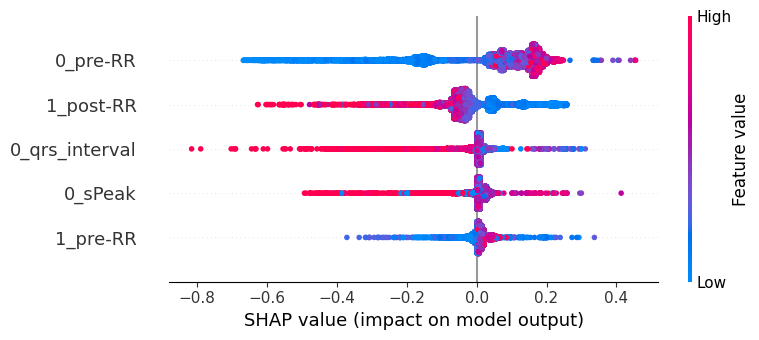

In [ ]:
shap.summary_plot(dt_shap_values[1], X_test_scaled,max_display=5,feature_names=X_test.columns,class_names=['arrhythmia', 'normal'])

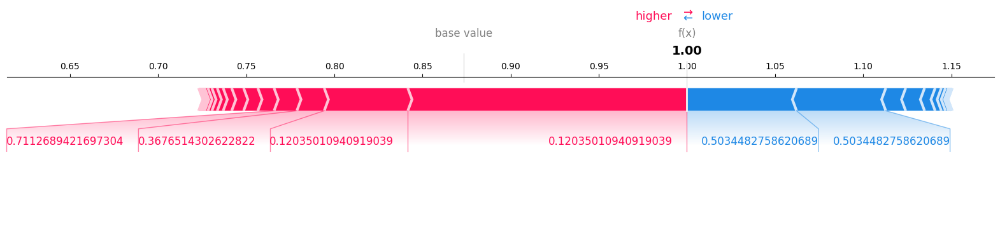

In [ ]:
shap.force_plot(dt_explainer.expected_value[1], dt_shap_values[1][10], data_for_prediction, matplotlib=True)